type:<class 'numpy.ndarray'>


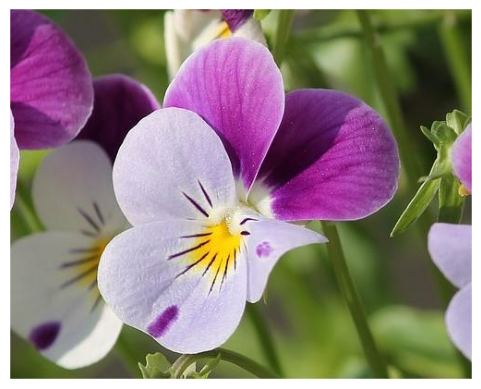

In [6]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('..\cat1.jpg')   # 从文件中读取图片,返回numpy矩阵
print(f'type:{type(img)}')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

# 旋转图片：
1.获取图片的宽和高  
2.调用调用函数cv2.getRotationMatrix2D() 得到旋转矩阵  
3.通过 wrapAffine 实现旋转

400 500
rotation image shape:(400, 500, 3)


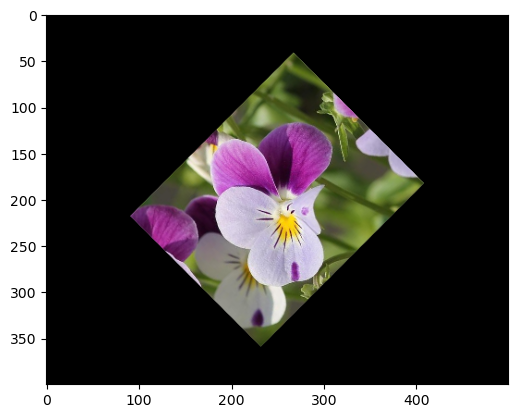

In [12]:
height , width = img.shape[:2] # shape（高，宽，通道数）
print(height,width)
rotationMatrix = cv2.getRotationMatrix2D((width/2, height/2), 45, .5)  # 得到旋转矩阵
rotationImage = cv2.warpAffine(img, rotationMatrix, (width, height))    #   实现旋转
print(f'rotation image shape:{rotationImage.shape}')
plt.imshow(cv2.cvtColor(rotationImage, cv2.COLOR_BGR2RGB))

# 裁剪图片
1.读取图片，获得宽和高  
2.确定裁剪后的宽和高  
3.开始裁剪

origin image shape:(400, 500, 3)
crop image shape:(280, 350, 3)


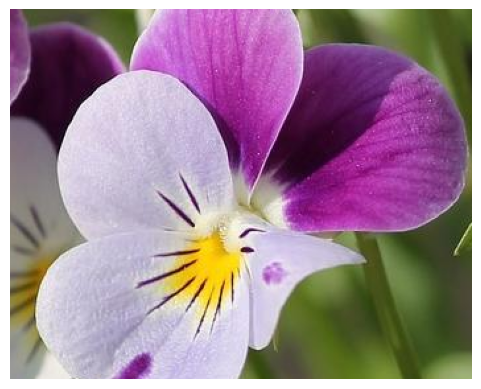

In [15]:
#   读取图片，获得宽和高
img = cv2.imread('..\cat1.jpg')
height, width = img.shape[:2]
print(f'origin image shape:{img.shape}')
# 设置裁剪后图片的大小
start_row = int(height * 0.15)
start_col = int(width * 0.15)
end_row = int(height * 0.85)
end_col = int(width * 0.85)
# 裁剪图片
cropped_image = img[start_row:end_row, start_col:end_col]
print(f'crop image shape:{cropped_image.shape}')
plt.axis('off')
plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))

# 调整图片大小
对图片进行调整大小的操作，采用的是resize() 函数，这里有两种方式进行调整大小：

1.坐标轴方式来指定缩放比例，即fx, fy 参数；  
2.直接给出调整后图片的大小。

origin image shape:(400, 500, 3)
new img shape:(300, 375, 3)


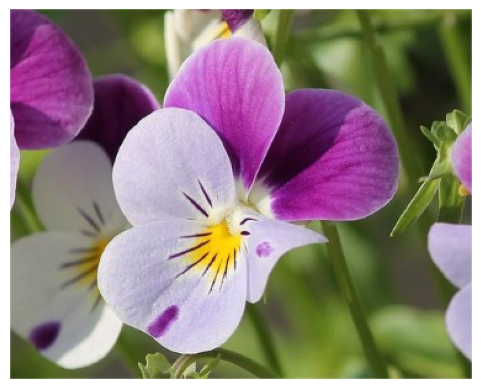

In [16]:
#   方法一
img = cv2.imread('..\cat1.jpg')
height , width = img.shape[:2]
print(f'origin image shape:{img.shape}')
new_img = cv2.resize(img, (0, 0), fx=0.75, fy=0.75)
print(f'new img shape:{new_img.shape}')
plt.axis('off')
plt.imshow(cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB))

new img shape:(800, 800, 3)


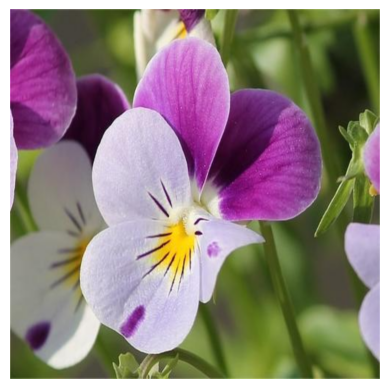

In [17]:
#   方法二
new_img = cv2.resize(img, (800, 800))
print(f'new img shape:{new_img.shape}')
plt.axis('off')
plt.imshow(cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB))

# 调整图片对比度

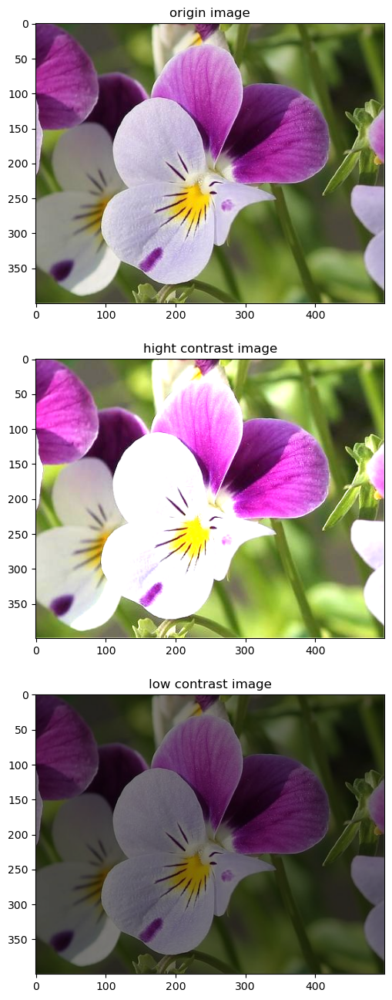

In [22]:
'''
cv2.addWeighted(source_img1, alpha1, source_img2, alpha2, beta)
接受两张输入图片，根据alpha来进行融合。单独调整图片对比度，而将第二个设置为0
'''

import numpy as np
img = cv2.imread('..\cat1.jpg')
# 高对比度
hight_contrast_img = cv2.addWeighted(img, 1.5, np.zeros(img.shape, img.dtype), 0, 0)
# 低对比度
low_contrast_img = cv2.addWeighted(img, 0.5, np.zeros(img.shape, img.dtype), 0, 0)
plt.figure(figsize=(32, 16))
plt.subplot(3, 1, 1)
plt.title('origin image')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(3, 1, 2)
plt.title('hight contrast image')
plt.imshow(cv2.cvtColor(hight_contrast_img, cv2.COLOR_BGR2RGB))
plt.subplot(3, 1, 3)
plt.title('low contrast image')
plt.imshow(cv2.cvtColor(low_contrast_img, cv2.COLOR_BGR2RGB))

# 模糊图片
## 高斯模糊
采用的是 GaussianBlur() 方法，采用高斯核，并且核的宽和高必须是正数，且是奇数。

高斯滤波主要用于消除高斯噪声，可以保留更多的图像细节，经常被称为最有用的滤波器。

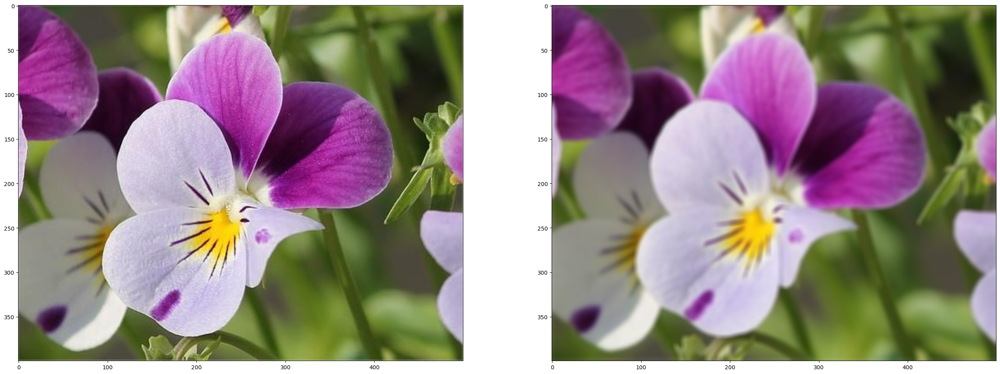

In [23]:
img = cv2.imread('..\cat1.jpg')
blur_img = cv2.GaussianBlur(img, (7, 7), 3)
plt.figure(figsize=(32, 32))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(blur_img, cv2.COLOR_BGR2RGB))

## 中值模糊
用设置区域内的中值来代替本像素值（类似平均池化），因此孤立的斑点，比如 0 或者 255 的数值很容易消除掉。

所以中值模糊主要用于消除椒盐噪声和斑点噪声。

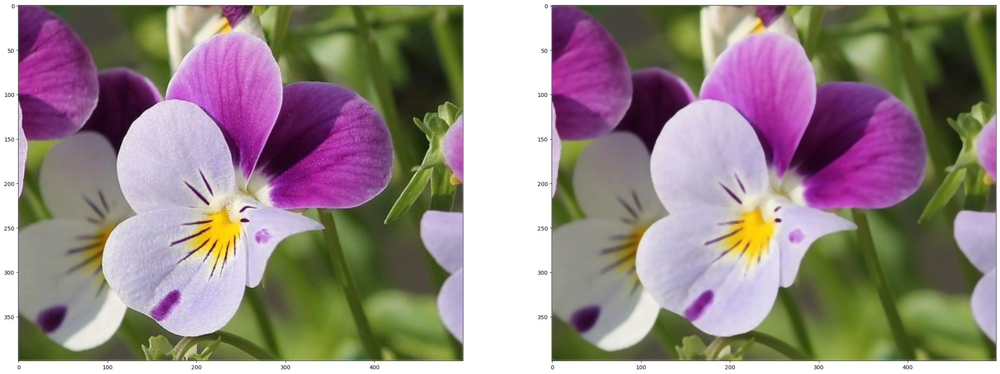

In [24]:
img = cv2.imread('..\cat1.jpg')
blur_img = cv2.medianBlur(img, 5)
plt.figure(figsize=(32, 32))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(blur_img, cv2.COLOR_BGR2RGB))

# 边缘检测
通过Canny() 方法，它实现了 Canny 边缘检测器，这也是目前最优的边缘检测器。

cv2.Canny(image, minVal, maxVal)minVal 和 maxVal 分别表示梯度强度值的最小值和最大值。

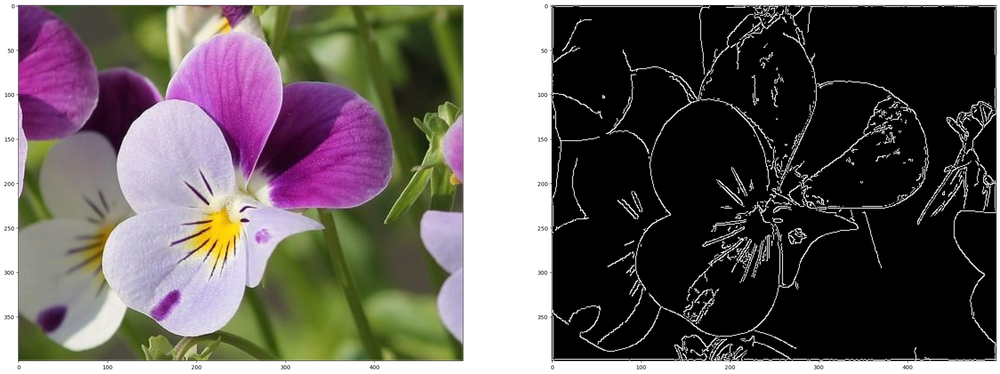

In [30]:
img = cv2.imread('..\cat1.jpg')
edge_img = cv2.Canny(img, 100, 200)
plt.figure(figsize=(32, 32))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(edge_img, cv2.COLOR_BGR2RGB))

# 转换为灰度图
最简单的就是在读取时，img = cv2.imread("example.jpg", 0)

另一种方法是使用BGR2GRAY

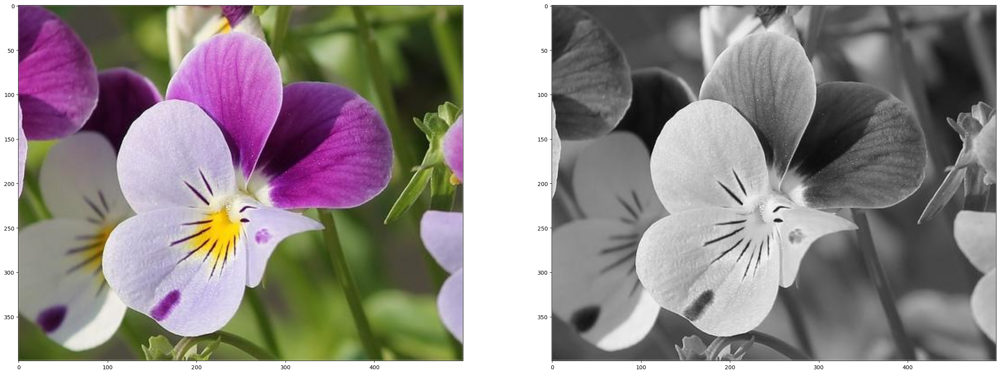

In [32]:
#   法一
img = cv2.imread('..\cat1.jpg')
gray_img = cv2.imread('..\cat1.jpg',0)
plt.figure(figsize=(32, 32))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(gray_img, cv2.COLOR_BGR2RGB))

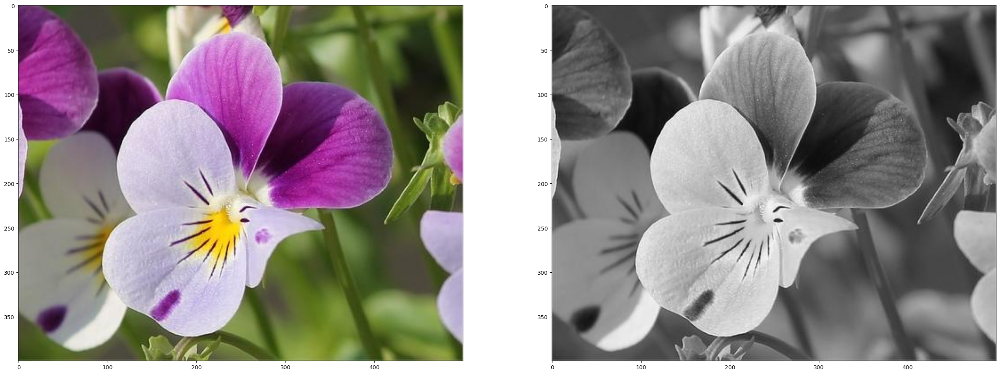

In [33]:
img = cv2.imread('..\cat1.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(32, 32))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(gray_img, cv2.COLOR_BGR2RGB))

# 颜色检测

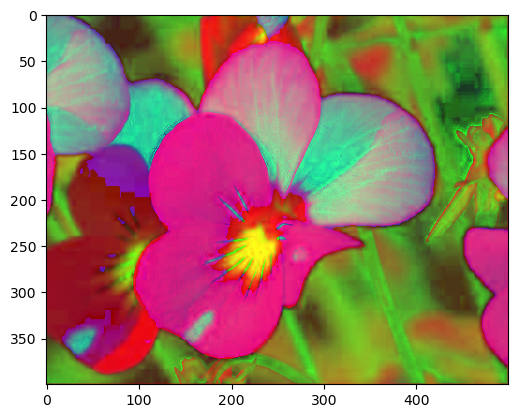

In [34]:
import cv2
import numpy as np
#   将图片转换为HSV
img = cv2.imread('..\cat1.jpg')
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
plt.imshow(cv2.cvtColor(hsv_img,cv2.COLOR_BGR2RGB))

In [35]:
#   设置绿色像素值的范围
lower_green = np.array([34, 177, 76])
upper_green = np.array([255, 255, 255])

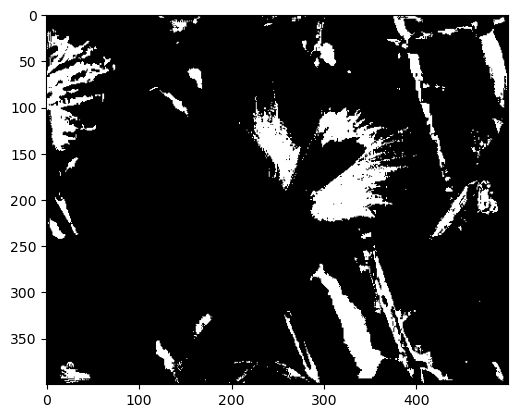

In [36]:
masking = cv2.inRange(hsv_img, lower_green, upper_green)
plt.imshow(cv2.cvtColor(masking, cv2.COLOR_BGR2RGB))

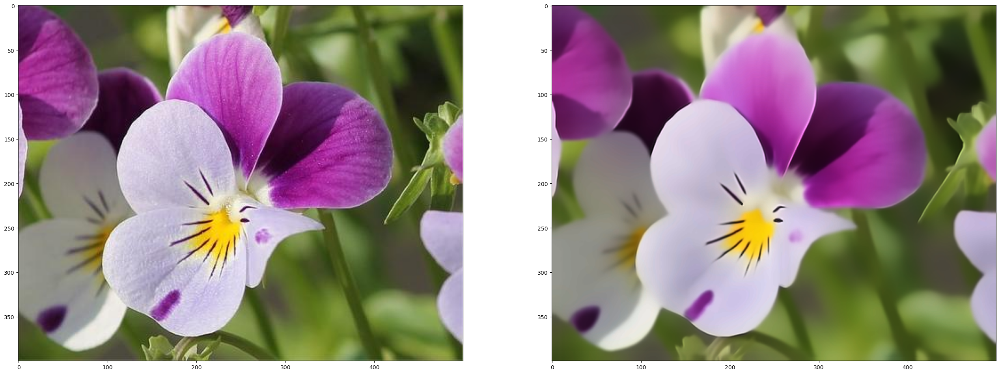

In [37]:
import cv2

img = cv2.imread('..\cat1.jpg')
result = cv2.fastNlMeansDenoisingColored(img,None,20,10,7,21)

plt.figure(figsize=(32, 32))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))